# Bone Marrow Immune Cell Differentiation

In [1]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
import pickle as pkl
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.stats
from scipy.io import mmread

sc.settings.verbosity = 3

In [2]:
read_from_h5ad = True

h5ad_path = '../../AML van Galen/BM1234.h5ad'

if read_from_h5ad:
    adata = sc.read_h5ad(h5ad_path)
else:
    dem_names = ['GSM3587996_BM1.dem.txt.gz', 
                 'GSM3587997_BM2.dem.txt.gz', 
                 'GSM3587998_BM3.dem.txt.gz',
                 'GSM3588000_BM4.dem.txt.gz',
                 'GSM3588002_BM5-34p.dem.txt.gz',
                 'GSM3588003_BM5-34p38n.dem.txt.gz']

    anno_names = ['GSM3587996_BM1.anno.txt.gz', 
                  'GSM3587997_BM2.anno.txt.gz',
                  'GSM3587999_BM3.anno.txt.gz',
                  'GSM3588001_BM4.anno.txt.gz',
                  'GSM3588002_BM5-34p.anno.txt.gz',
                  'GSM3588003_BM5-34p38n.anno.txt.gz']

    adata_list = [sc.read_text('../../AML van Galen/' + dem_names[i]).T for i in range(6)]

    for i in range(6):
        adata_list[i].obs = pd.read_table('../../AML van Galen/' + anno_names[i], index_col=0)

    adata = adata_list[0].concatenate(adata_list[1:])
    
    adata.write_h5ad(h5ad_path)

In [3]:
adata

AnnData object with n_obs × n_vars = 7698 × 27899
    obs: 'NumberOfReads', 'AlignedToGenome', 'AlignedToTranscriptome', 'TranscriptomeUMIs', 'NumberOfGenes', 'CyclingScore', 'CyclingBinary', 'MutTranscripts', 'WtTranscripts', 'PredictionRF2', 'PredictionRefined', 'CellType', 'Score_HSC', 'Score_Prog', 'Score_GMP', 'Score_ProMono', 'Score_Mono', 'Score_cDC', 'Score_pDC', 'Score_earlyEry', 'Score_lateEry', 'Score_ProB', 'Score_B', 'Score_Plasma', 'Score_T', 'Score_CTL', 'Score_NK', 'batch'

normalizing counts per cell
    finished (0:00:00)


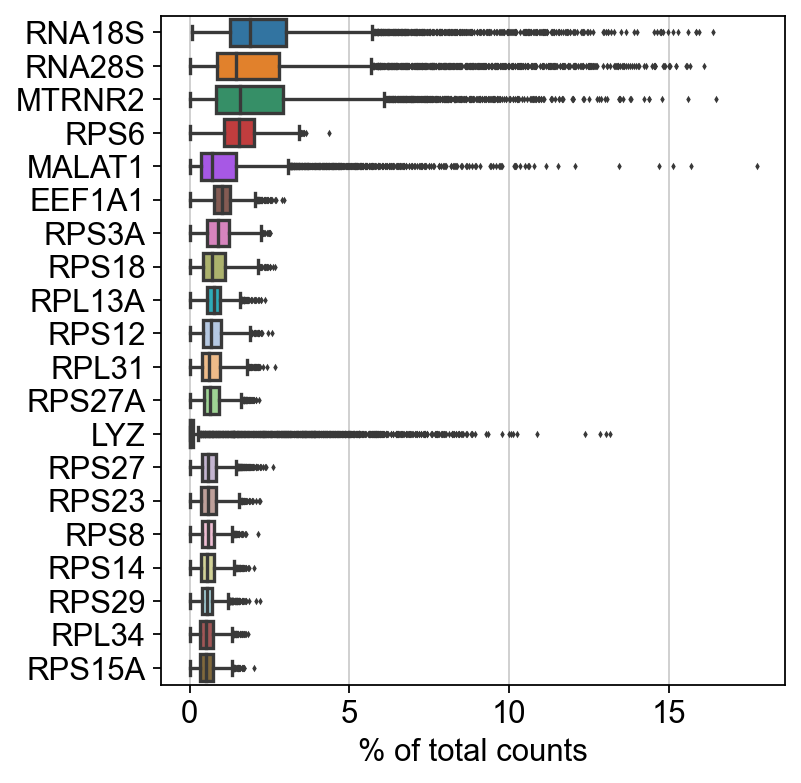

In [4]:
sc.settings.set_figure_params(dpi=80, facecolor='white')
sc.pl.highest_expr_genes(adata, n_top=20)

In [5]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 9444 genes that are detected in less than 3 cells


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


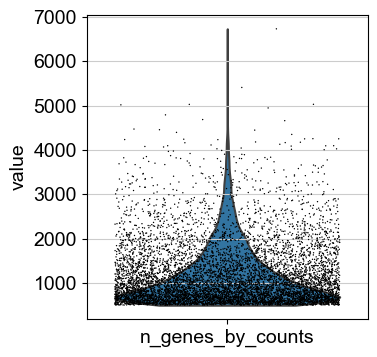

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


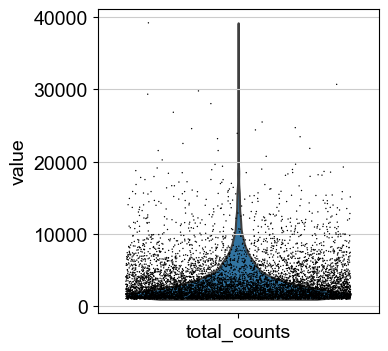

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


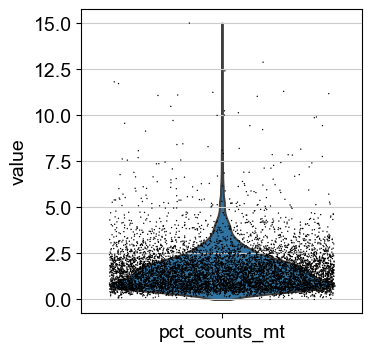

In [6]:
sc.settings.set_figure_params(dpi=50, facecolor='white')

adata.var['mt'] = adata.var.index.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts'], jitter=0.4)
sc.pl.violin(adata, ['total_counts'], jitter=0.4)
sc.pl.violin(adata, ['pct_counts_mt'], jitter=0.4)

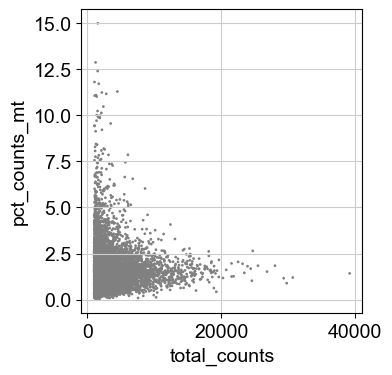

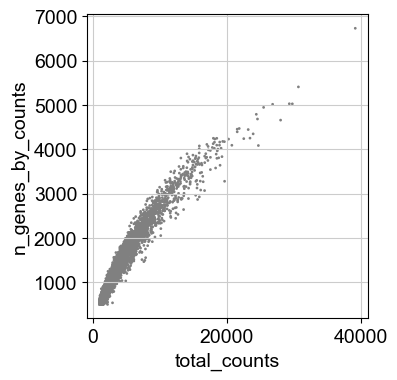

In [7]:
sc.settings.set_figure_params(dpi=50, facecolor='white')

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [8]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


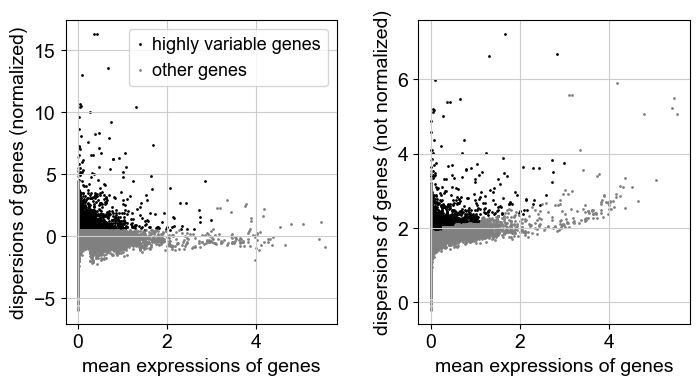

3352

In [9]:
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

adata.var.highly_variable.sum()

In [10]:
adata.raw = adata

In [11]:
adata = adata[:, adata.var.highly_variable]

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [12]:
sc.pp.scale(adata, max_value=10)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\scanpy\preprocessing\_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


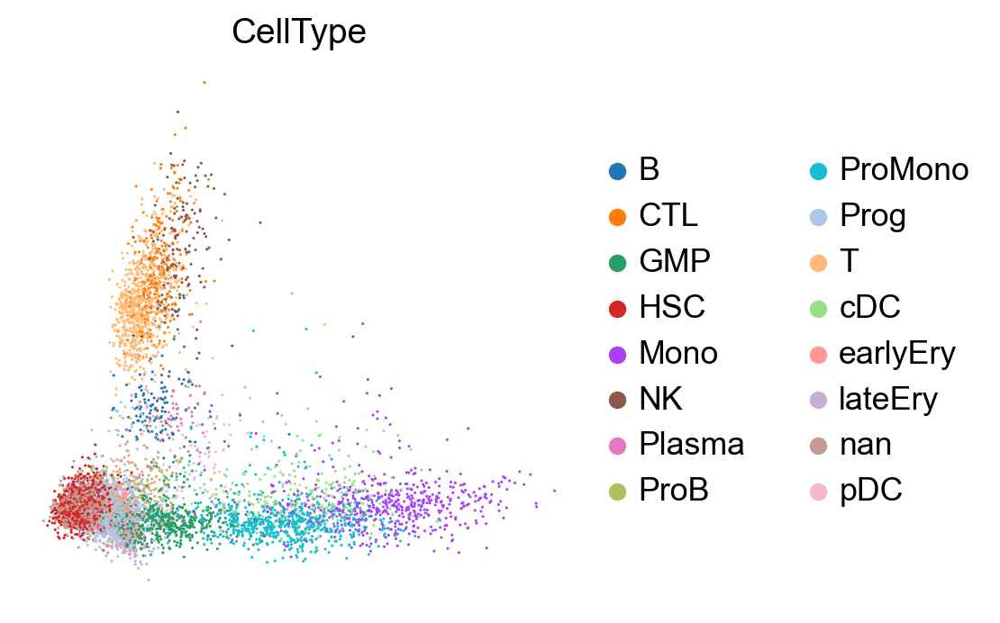

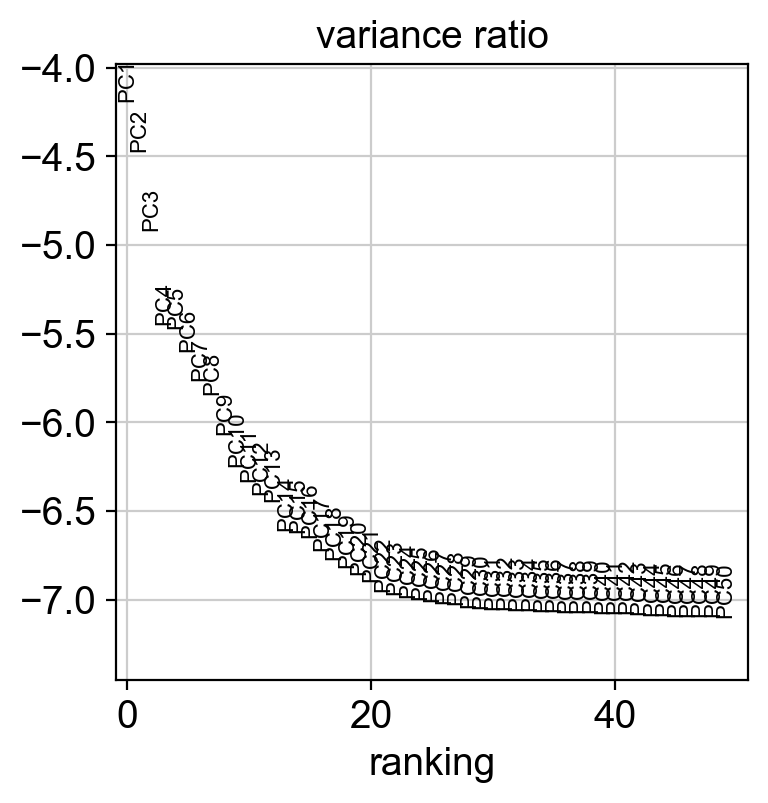

In [13]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color=['CellType'], size=5., frameon=False)
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 25
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


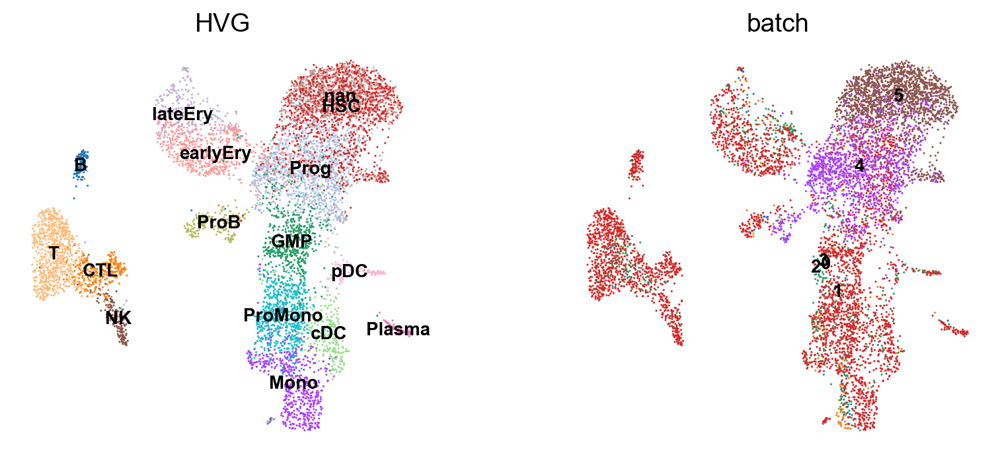

In [14]:
sc.pp.neighbors(adata, n_pcs=25)
sc.tl.umap(adata)
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata, color=['CellType', 'batch'], legend_loc="on data", frameon=False, size=5., legend_fontsize=10, title='HVG')

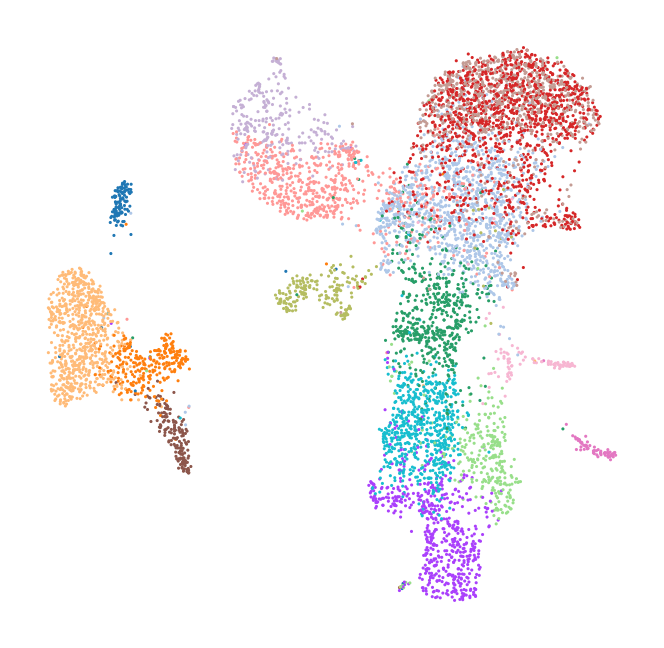

In [15]:
sc.pl.umap(adata, color=['CellType'], legend_loc=None, frameon=False, size=5., legend_fontsize=10, title='')

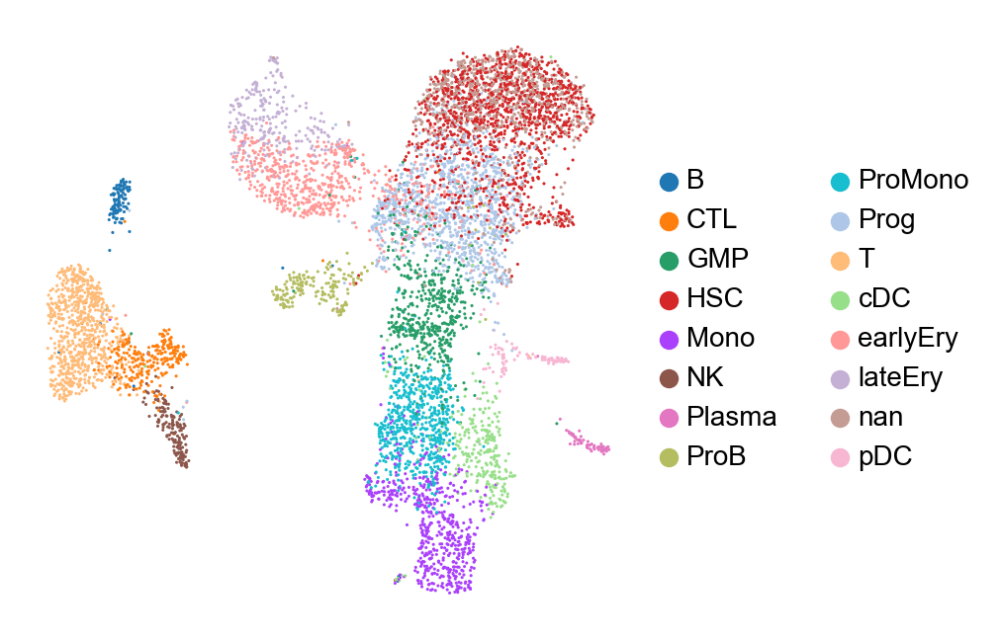

In [16]:
sc.pl.umap(adata, color=['CellType'], frameon=False, size=5., legend_fontsize=10, title='')

## SCMER Feature Selection

In [17]:
import sys
sys.path.insert(0, '..')
import compactmarker

model = compactmarker.UmapL1(w=1., lasso=3.3e-4, ridge=0., n_pcs=25, perplexity=100., use_beta_in_Q=True, n_threads=6, 
                             max_outer_iter=3)
model.fit(adata.X)

Calculating distance matrix and scaling factors...
Computing pairwise distances...
Using 6 threads...
Mean value of sigma: 0.767693
Done. Elapsed time: 48.19 seconds. Total: 48.19 seconds.
Creating model without batches...
Optimizing using OWLQN (because lasso is nonzero)...
0 loss: 5.5735859870910645 Nonzero: 110 Elapsed time: 178.27 seconds. Total: 226.47 seconds.
1 loss: 3.7979912757873535 Nonzero: 110 Elapsed time: 183.35 seconds. Total: 409.81 seconds.
2 loss: 3.7917709350585938 Nonzero: 110 Elapsed time: 183.99 seconds. Total: 593.80 seconds.
final loss: 3.7223687171936035 Nonzero: 110 Elapsed time: 2.86 seconds. Total: 596.66 seconds.


In [18]:
selected_genes = adata.var_names[model.get_mask(100)]
print(*selected_genes)
print(len(selected_genes))

AHSP ANXA1 APOOL AREG ASPM ATP2B1 BCL11A C5AR1 CA1 CALR CCL5 CD3D CD52 CD74 CDK6 CENPF CENPU CLC CST3 CSTA CTSS CYBB DNTT DUSP1 EGR1 ELANE EREG ETS1 FCER1A FCN1 FGL2 FYB1 GNLY GPR183 GZMB HBA1 HBB HBD HIST1H1B HIST1H1C HIST1H2AJ HIST1H4C HLA-B HLA-DPA1 HLA-DRA HLA-E HLF HMGB2 HMGN2 HOPX HSP90B1 IGLL1 IL7R IQGAP1 IRF8 JCHAIN JUN KIAA0087 KLF6 MEIS1 MKI67 MNDA MPO MS4A1 MSI2 MT-ND5 MZB1 NAMPT NEAT1 NPR3 NRIP1 NUSAP1 PDZD8 PIK3R1 PRG2 PRKG2 PRSS2 PRTN3 PSAP PTPRC RNASE2 S100A10 S100A12 S100A6 SAMHD1 SAMSN1 SAT1 SLC40A1 SOX4 SPINK2 STK17B STMN1 TCF4 THBS1 TOP2A TXNDC5 TXNIP VCAN VPREB1 ZFAS1
100


## Validation

In [19]:
established_markers = {
    "Undifferentiated": ["MEIS1", "EGR1", "MSI2", "CD38", "CD34", "PROM1", "EGFL7"],
    "Myeloid GMP-Promono": ['MPO', "ELANE", "CTSG", "AZU1"],
    "Myeloid Promono-differentiated": ["LYST", "LYZ", "CEBPD", "MNDA", "FCER1G", "CLEC4A"],
    "Myeloid mono": ['FCN1', "CD14", "C5AR1"],
    "Myeloid cDC": ['CLEC10A', "FCER1A"],
    "Myeloid pDC": ['CLEC4C', 'PTPRS', 'IRF8', 'TCF4', 'JCHAIN', 'GZMB'],
    "Ery": ['CSF1', "KIT", "HBB", "HBD", "GYPA"],
    "Lymphoid Pro B": ['CD24', 'EBF1', 'MME', 'VPREB1', 'PAX5', 'CD19', 'CD79A'],
    "Lymphoid B": ['MS4A1', 'BANK1'],
    "Lymphoid Plasma": ['MZB1', 'IGLL5', 'JCHAIN'],
    'Lymphoid T/CLT': ['CD3D', 'CD3G', 'IL32', 'IL7R', 'TCF7'],
    'Lymphoid CLT/NK': ['CD8A', 'KLRB1', 'KLRD1', 'GZMB', 'NCAM1', 'CCL5', 'GZMK']
}

from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

selected_markers = selected_genes
all_markers = adata.var_names.tolist()
for i in established_markers:
    temp = " ".join((i, str(len(set(established_markers[i]).intersection(set(selected_markers)))), 
                     '/', str(len(set(established_markers[i]).intersection(set(all_markers)))), 
                     "(", str(len(established_markers[i])), "): "))
    printmd(temp + '_' + '_, _'.join(set(established_markers[i]).intersection(set(selected_markers))) + '_')

Undifferentiated 3 / 3 ( 7 ): _MEIS1_, _MSI2_, _EGR1_

Myeloid GMP-Promono 2 / 4 ( 4 ): _ELANE_, _MPO_

Myeloid Promono-differentiated 1 / 4 ( 6 ): _MNDA_

Myeloid mono 2 / 3 ( 3 ): _FCN1_, _C5AR1_

Myeloid cDC 1 / 1 ( 2 ): _FCER1A_

Myeloid pDC 4 / 6 ( 6 ): _TCF4_, _JCHAIN_, _IRF8_, _GZMB_

Ery 2 / 3 ( 5 ): _HBD_, _HBB_

Lymphoid Pro B 1 / 7 ( 7 ): _VPREB1_

Lymphoid B 1 / 2 ( 2 ): _MS4A1_

Lymphoid Plasma 2 / 3 ( 3 ): _JCHAIN_, _MZB1_

Lymphoid T/CLT 2 / 5 ( 5 ): _CD3D_, _IL7R_

Lymphoid CLT/NK 2 / 7 ( 7 ): _CCL5_, _GZMB_

In [20]:
temp = set(selected_markers.copy())
for i in established_markers:
    temp -= set(established_markers[i])
    
printmd('_' + '_, _'.join(temp) + '_')

_S100A10_, _HLA-DPA1_, _HLA-E_, _ETS1_, _FGL2_, _HOPX_, _SAMHD1_, _ANXA1_, _HIST1H2AJ_, _BCL11A_, _CENPU_, _APOOL_, _HIST1H4C_, _PRTN3_, _MKI67_, _HLF_, _CENPF_, _TOP2A_, _DUSP1_, _NEAT1_, _DNTT_, _PRKG2_, _HLA-DRA_, _HMGN2_, _ASPM_, _GPR183_, _EREG_, _CD52_, _KLF6_, _TXNIP_, _CALR_, _HSP90B1_, _CA1_, _AHSP_, _CYBB_, _HBA1_, _CST3_, _ZFAS1_, _CTSS_, _AREG_, _IGLL1_, _HIST1H1B_, _SAMSN1_, _S100A12_, _PTPRC_, _GNLY_, _CDK6_, _JUN_, _NRIP1_, _ATP2B1_, _NPR3_, _HMGB2_, _CLC_, _FYB1_, _NAMPT_, _CD74_, _STK17B_, _SOX4_, _RNASE2_, _STMN1_, _PRG2_, _PRSS2_, _THBS1_, _VCAN_, _IQGAP1_, _MT-ND5_, _SLC40A1_, _TXNDC5_, _PSAP_, _PIK3R1_, _HLA-B_, _SPINK2_, _HIST1H1C_, _CSTA_, _KIAA0087_, _SAT1_, _PDZD8_, _NUSAP1_, _S100A6_

computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:00)


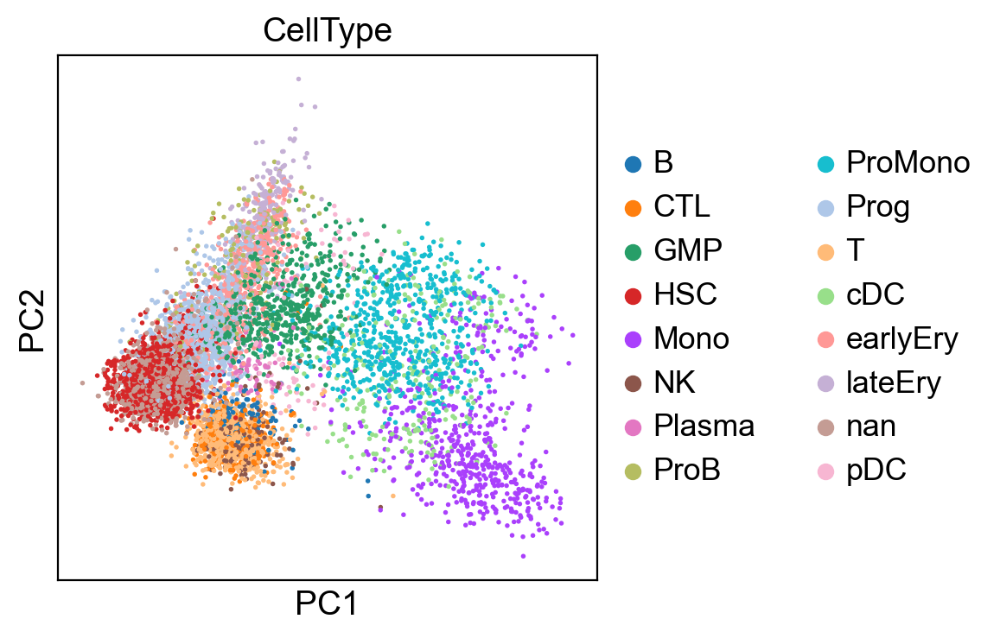

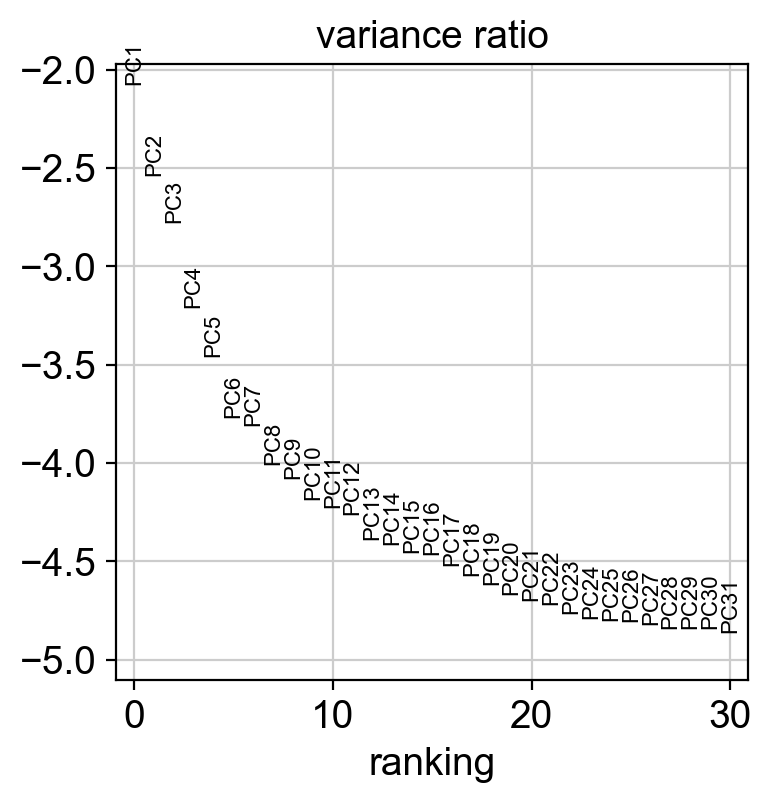

In [21]:
new_adata = adata[:, selected_genes]
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pl.pca(new_adata, color=['CellType'])
sc.pl.pca_variance_ratio(new_adata, log=True)

computing neighbors
    using 'X_pca' with n_pcs = 12
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


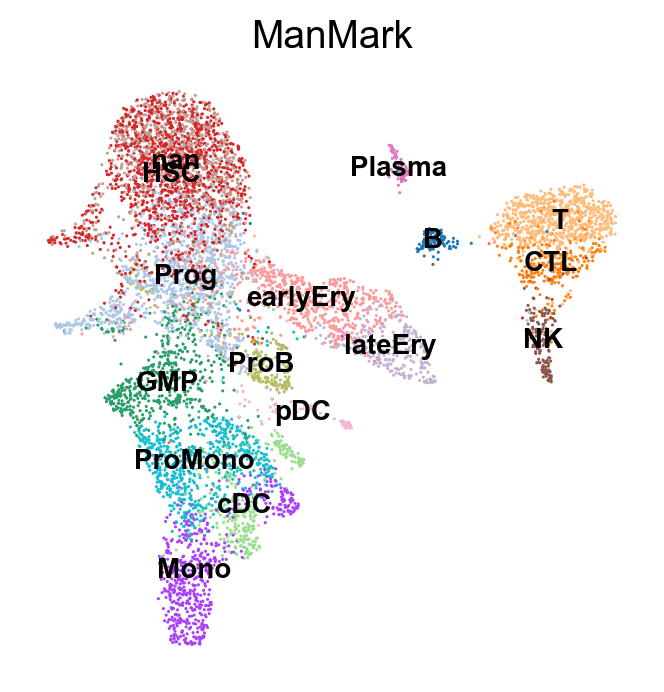

In [22]:
sc.pp.neighbors(new_adata, n_pcs=12)
sc.tl.umap(new_adata)
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(new_adata, color=['CellType'], legend_loc="on data", frameon=False, size=5., legend_fontsize=10, title='ManMark')

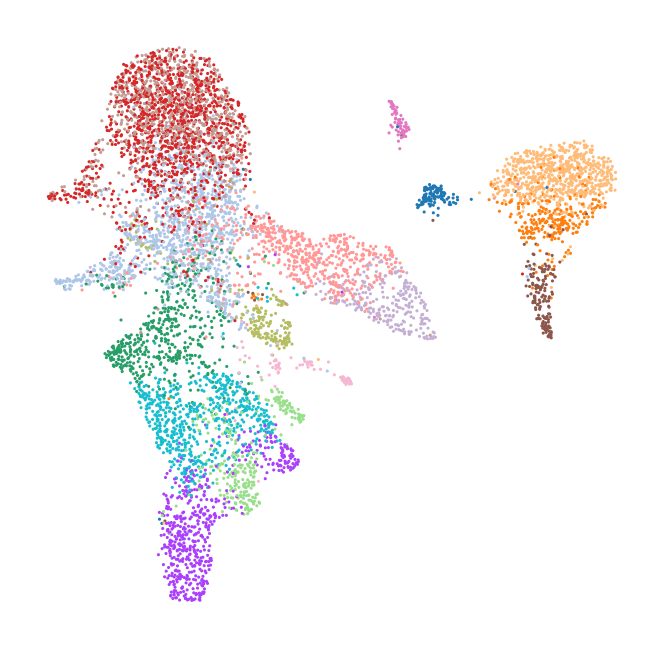

In [23]:
sc.pl.umap(new_adata, color=['CellType'], legend_loc=None, frameon=False, size=5., legend_fontsize=10, title='')

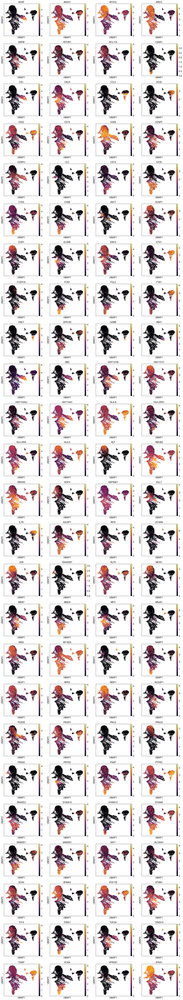

In [24]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(new_adata, color=selected_genes, color_map="inferno")

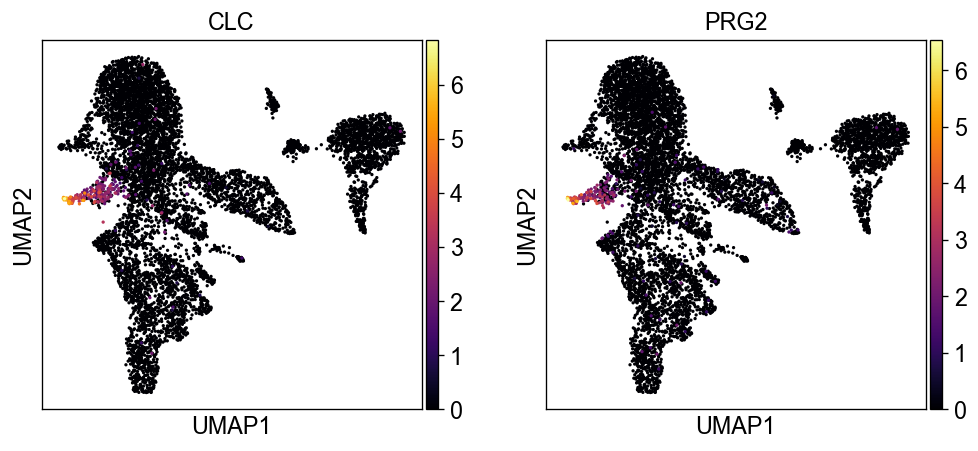

In [25]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(new_adata, color=['CLC', 'PRG2'], color_map='inferno')

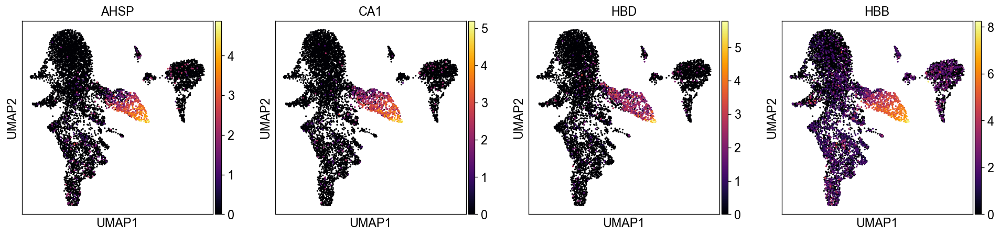

In [26]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(new_adata, color=['AHSP', 'CA1', 'HBD', 'HBB'], color_map='inferno')

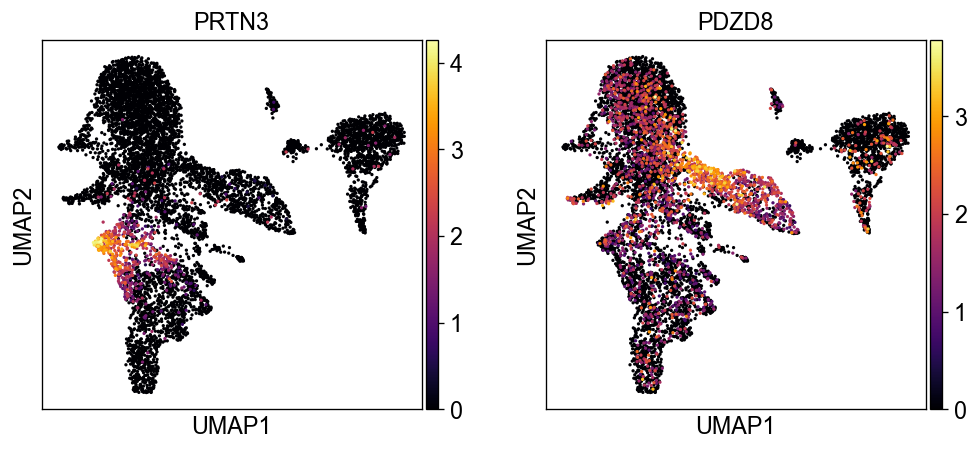

In [27]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(new_adata, color=['PRTN3', 'PDZD8'], color_map='inferno')

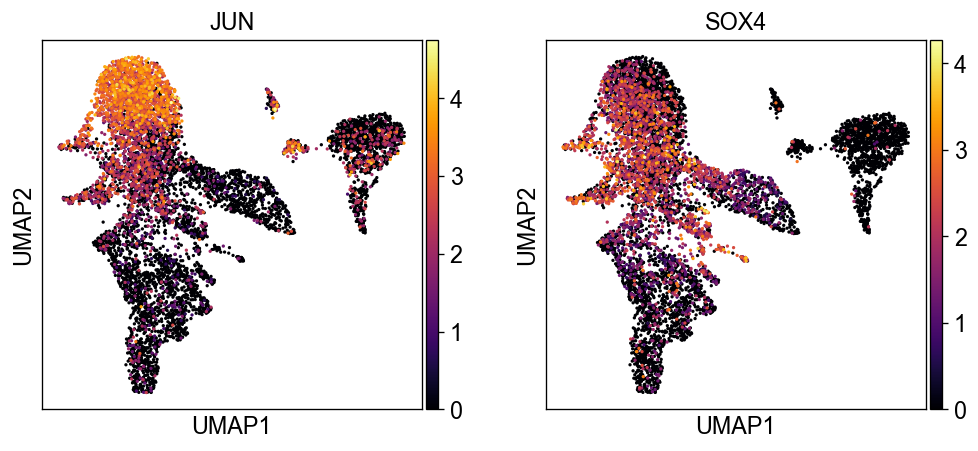

In [28]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(new_adata, color=['JUN', 'SOX4'], color_map='inferno')

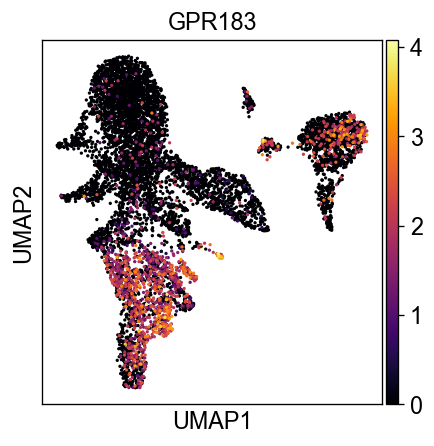

In [29]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(new_adata, color=['GPR183'], color_map='inferno')

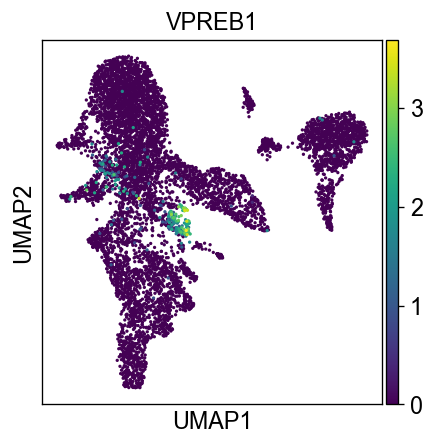

In [30]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(new_adata, color=['VPREB1'])

In [31]:
weight_df = pd.DataFrame(model.w[model.w > 0.], index=adata.var_names[model.w > 0.])
weight_df.to_pickle("bm-weights.pkl")
weight_df.to_csv("bm-weigths.csv")